<a href="https://colab.research.google.com/github/swaroop-2007/Deep-Fake-Detection/blob/main/DeepFake_Detection_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files

In [3]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"swaroopudgaonkar","key":"87addd9b23aa578ed302bd9aeeb1c524"}'}

In [4]:
!mkdir ~/.kaggle

In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle datasets list

ref                                                   title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rahulvyasm/netflix-movies-and-tv-shows                Netflix Movies and TV Shows                           1MB  2024-04-10 09:48:38           3682         72  1.0              
nayanack/netflix                                      Netflix Chronicles: Exploring Movies and TV Shows     1MB  2024-04-16 07:36:08           1107         23  0.88235295       
asaniczka/university-employee-salaries-2011-present   University Employee Salaries (2011 - Present)        17MB  2024-04-07 10:11:15           1614         45  1.0              
akankshaaa013/top-grossing-movies-dataset             Top Grossing Movies Dataset                          33K

In [8]:
! kaggle competitions download -c 'deepfake-detection-challenge'

100% 4.13G/4.13G [02:17<00:00, 37.5MB/s]
100% 4.13G/4.13G [02:17<00:00, 32.2MB/s]


In [9]:
! unzip deepfake-detection-challenge.zip

Archive:  deepfake-detection-challenge.zip
  inflating: sample_submission.csv   
  inflating: test_videos/aassnaulhq.mp4  
  inflating: test_videos/aayfryxljh.mp4  
  inflating: test_videos/acazlolrpz.mp4  
  inflating: test_videos/adohdulfwb.mp4  
  inflating: test_videos/ahjnxtiamx.mp4  
  inflating: test_videos/ajiyrjfyzp.mp4  
  inflating: test_videos/aktnlyqpah.mp4  
  inflating: test_videos/alrtntfxtd.mp4  
  inflating: test_videos/aomqqjipcp.mp4  
  inflating: test_videos/apedduehoy.mp4  
  inflating: test_videos/apvzjkvnwn.mp4  
  inflating: test_videos/aqrsylrzgi.mp4  
  inflating: test_videos/axfhbpkdlc.mp4  
  inflating: test_videos/ayipraspbn.mp4  
  inflating: test_videos/bcbqxhziqz.mp4  
  inflating: test_videos/bcvheslzrq.mp4  
  inflating: test_videos/bdshuoldwx.mp4  
  inflating: test_videos/bfdopzvxbi.mp4  
  inflating: test_videos/bfjsthfhbd.mp4  
  inflating: test_videos/bjyaxvggle.mp4  
  inflating: test_videos/bkcyglmfci.mp4  
  inflating: test_videos/bktkwbcawi.m

In [10]:
from tensorflow import keras
#from imutils import paths

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [11]:
TRAIN_SAMPLE_FOLDER = '/content/train_sample_videos'
TEST_FOLDER = '/content/test_videos'

In [12]:
print(f"Train samples: {len(os.listdir(os.path.join(TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(TEST_FOLDER)))}")

Train samples: 401
Test samples: 400


In [13]:
train_sample_metadata = pd.read_json('/content/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


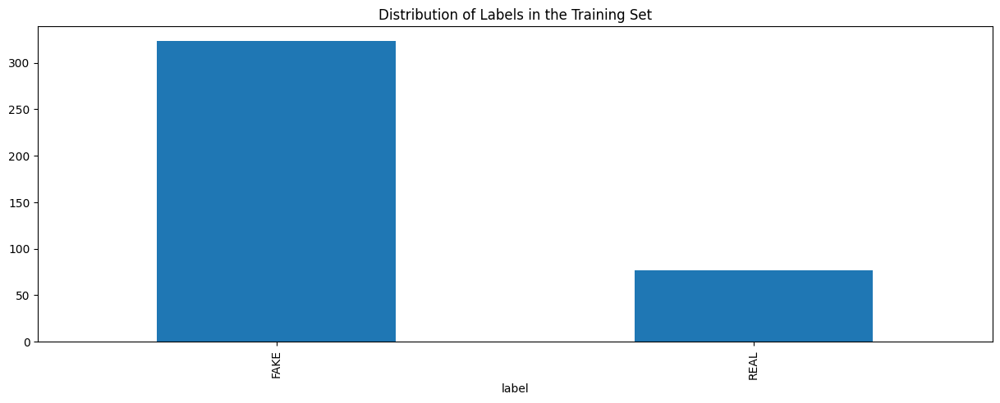

In [14]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [15]:
train_sample_metadata.shape

(400, 3)

In [16]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
fake_train_sample_video

['etmcruaihe.mp4', 'deyyistcrd.mp4', 'dkrvorliqc.mp4']

In [17]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

original
atvmxvwyns.mp4    6
meawmsgiti.mp4    6
qeumxirsme.mp4    5
kgbkktcjxf.mp4    5
fysyrqfguw.mp4    4
Name: count, dtype: int64

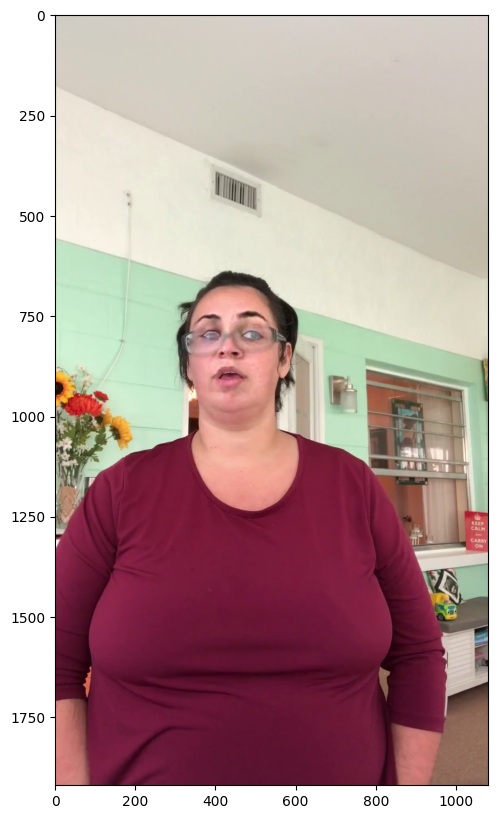

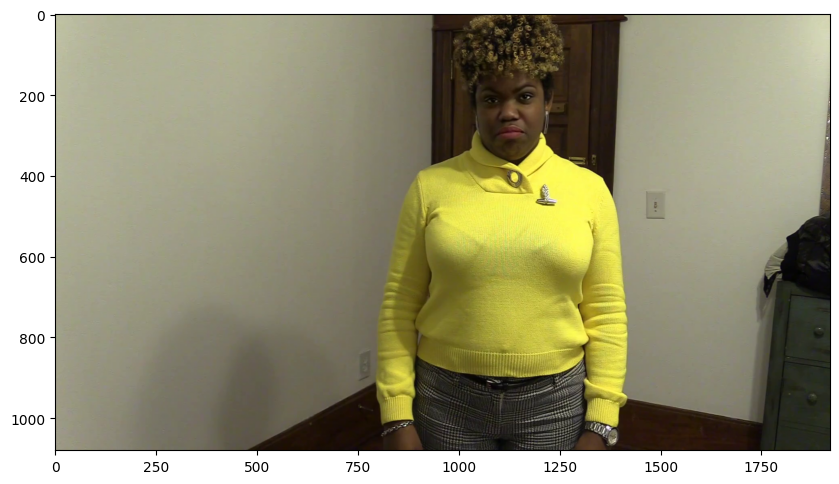

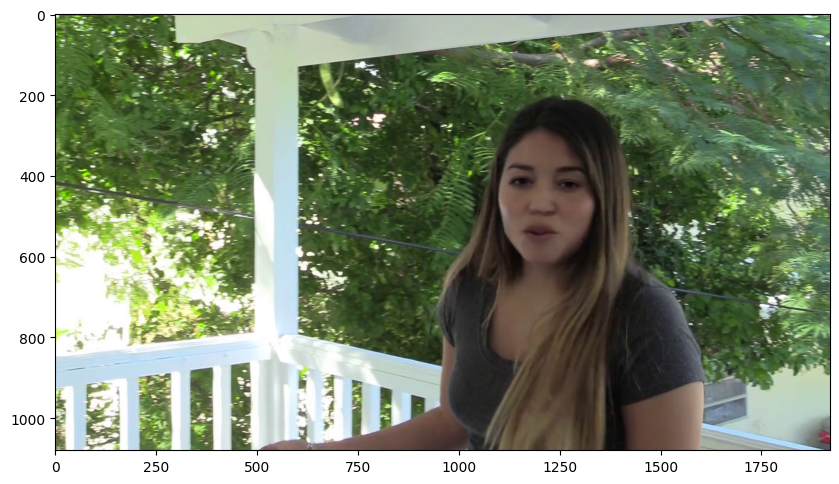

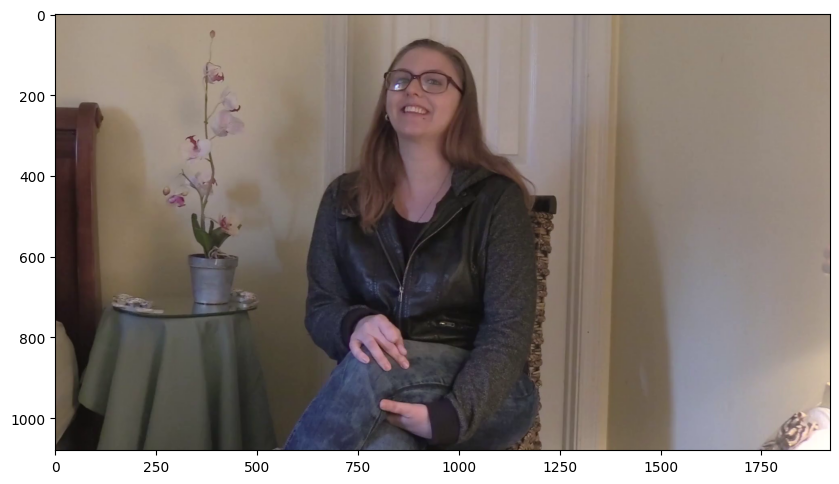

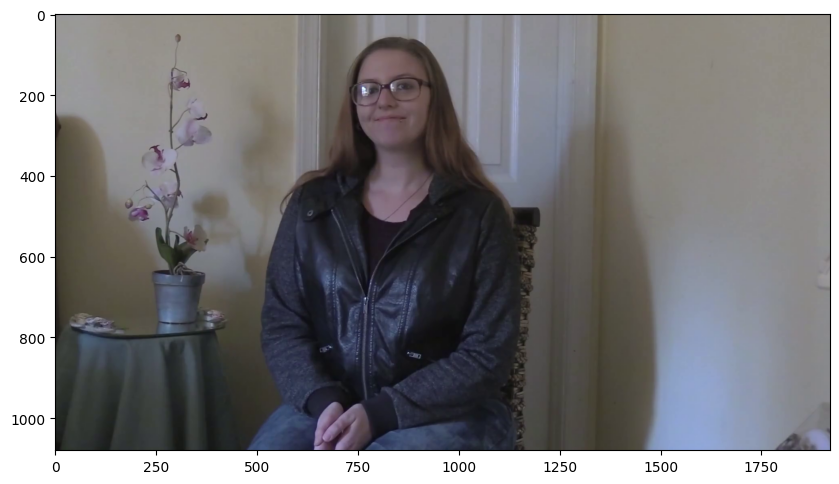

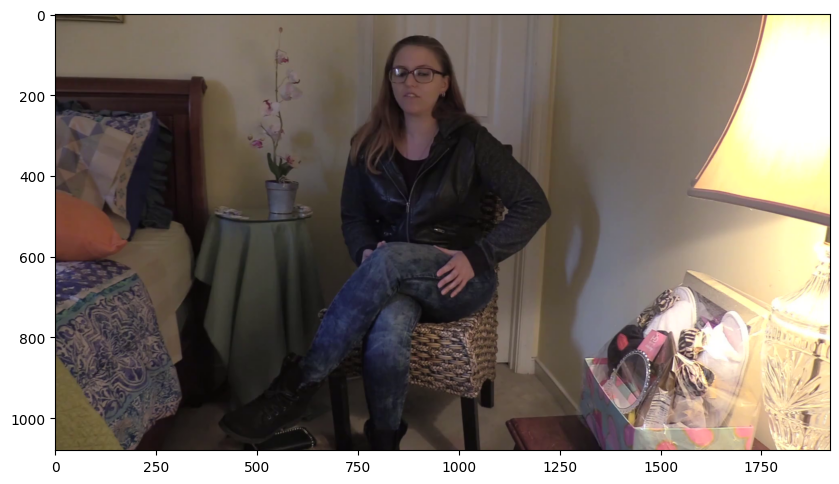

In [18]:
for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(TRAIN_SAMPLE_FOLDER, video_file))

real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)
real_train_sample_video

for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(TRAIN_SAMPLE_FOLDER, video_file))

train_sample_metadata['original'].value_counts()[0:5]

In [19]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    '''
    input: video_path_list - path for video
    process:
    0. for each video in the video path list
        1. perform a video capture from the video
        2. read the image
        3. display the image
    '''
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    # we only show images extracted from the first 6 videos
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path)
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')

,video
0,oocincvedt.mp4
1,vbcgoyxsvn.mp4
2,njzshtfmcw.mp4
3,fqgypsunzr.mp4
4,cqxxumarvp.mp4


<Figure size 640x480 with 0 Axes>

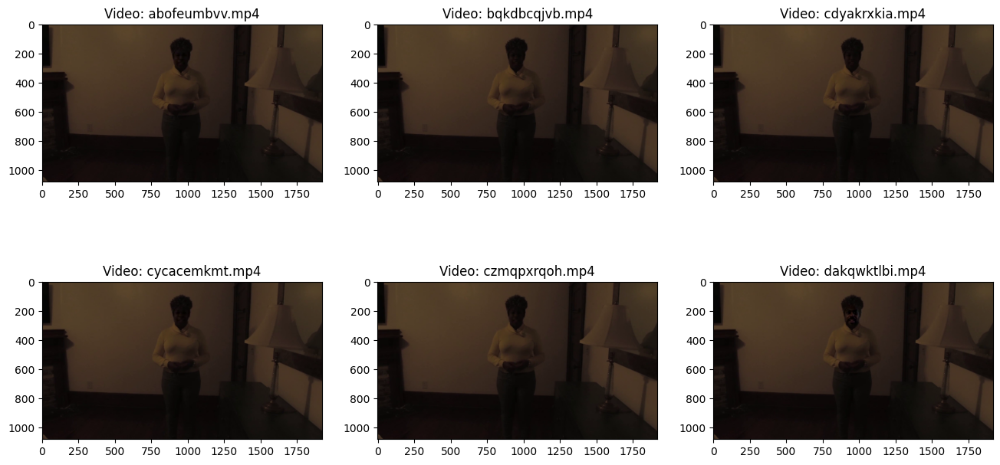

In [21]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='atvmxvwyns.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

test_videos = pd.DataFrame(list(os.listdir(os.path.join(TEST_FOLDER))), columns=['video'])

test_videos.head()

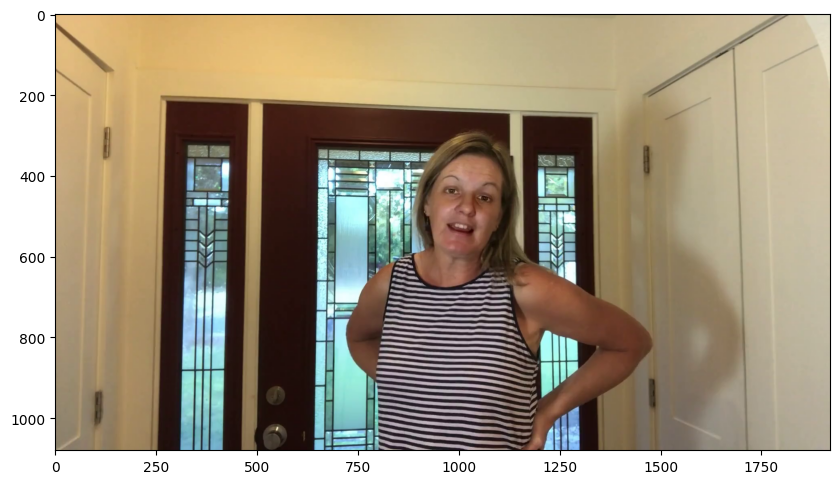

In [22]:
display_image_from_video(os.path.join(TEST_FOLDER, test_videos.iloc[2].video))

fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [23]:
from IPython.display import HTML
from base64 import b64encode

In [24]:
def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)


In [25]:
play_video(fake_videos[10])

In [48]:
IMG_SIZE = 224
BATCH_SIZE = 80
EPOCHS = 20

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [49]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]

In [50]:
def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [51]:
def build_feature_extractor():
    # Define the CNN model (here, using a simple CNN architecture)
    model = keras.Sequential([
        keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Conv2D(64, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Conv2D(64, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Conv2D(128, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation='relu'),
    ])
    return model

In [52]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(int)

    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                frame_features[idx, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )

    return frame_features, labels

In [53]:
def build_model():
    frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))

    x = keras.layers.Conv1D(16, 3, activation='relu')(frame_features_input)
    x = keras.layers.MaxPooling1D(2)(x)  # Adjust the pool size to preserve dimensions
    x = keras.layers.Conv1D(32, 3, activation='relu')(x)
    x = keras.layers.MaxPooling1D(2)(x)  # Adjust the pool size to preserve dimensions
    x = keras.layers.Conv1D(64, 3, activation='relu')(x)
    x = keras.layers.GlobalMaxPooling1D()(x)
    x = keras.layers.Dropout(0.4)(x)
    x = keras.layers.Dense(64, activation="relu")(x)

    output = keras.layers.Dense(1, activation="sigmoid")(x)

    model = keras.Model(frame_features_input, output)
    return model


In [54]:
from sklearn.model_selection import train_test_split

In [55]:
feature_extractor = build_feature_extractor()

Train_set, Test_set = train_test_split(train_sample_metadata,test_size=0.1,random_state=42,stratify=train_sample_metadata['label'])

print(Train_set.shape, Test_set.shape )

train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set: {train_data.shape}")

(360, 3) (40, 3)
Frame features in train set: (360, 20, 2048)


In [56]:
model = build_model()

model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 20, 2048)]        0         
                                                                 
 conv1d_6 (Conv1D)           (None, 18, 16)            98320     
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 9, 16)             0         
 g1D)                                                            
                                                                 
 conv1d_7 (Conv1D)           (None, 7, 32)             1568      
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 3, 32)             0         
 g1D)                                                            
                                                                 
 conv1d_8 (Conv1D)           (None, 1, 64)             6208

In [57]:
checkpoint = keras.callbacks.ModelCheckpoint('.weights.h5', save_weights_only=True, save_best_only=True)
history = model.fit(
        train_data,
        train_labels,
        validation_data=(test_data, test_labels),
        callbacks=[checkpoint],
        epochs=EPOCHS,
        batch_size=8
    )

Epoch 1/20
45/45 [==============================] - 3s 16ms/step - loss: 0.6873 - accuracy: 0.7917 - val_loss: 0.6813 - val_accuracy: 0.8000
Epoch 2/20
45/45 [==============================] - 1s 12ms/step - loss: 0.6752 - accuracy: 0.8083 - val_loss: 0.6699 - val_accuracy: 0.8000
Epoch 3/20
45/45 [==============================] - 1s 11ms/step - loss: 0.6635 - accuracy: 0.8083 - val_loss: 0.6589 - val_accuracy: 0.8000
Epoch 4/20
45/45 [==============================] - 1s 11ms/step - loss: 0.6526 - accuracy: 0.8083 - val_loss: 0.6484 - val_accuracy: 0.8000
Epoch 5/20
45/45 [==============================] - 1s 11ms/step - loss: 0.6422 - accuracy: 0.8083 - val_loss: 0.6387 - val_accuracy: 0.8000
Epoch 6/20
45/45 [==============================] - 1s 13ms/step - loss: 0.6324 - accuracy: 0.8083 - val_loss: 0.6295 - val_accuracy: 0.8000
Epoch 7/20
45/45 [==============================] - 1s 16ms/step - loss: 0.6232 - accuracy: 0.8083 - val_loss: 0.6207 - val_accuracy: 0.8000
Epoch 8/20
45

In [46]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

In [47]:
def sequence_prediction(path):
    frames = load_video(os.path.join(TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

test_video = "/content/train_sample_videos/aelfnikyqj.mp4"
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)<=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')


play_video(test_video,TEST_FOLDER)

test_video = "/content/train_sample_videos/ebkzwjgjhq.mp4"
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)<=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')


play_video(test_video,TEST_FOLDER)

Test video path: /content/train_sample_videos/aelfnikyqj.mp4
1/1 [==============================] - 0s 45ms/step


ValueError: could not broadcast input array from shape (128,) into shape (2048,)

### Updating the parameters, making few changes